### Project Overview 🌳🛰️

#### Developers and Affiliations:
- **Mohammadreza Narimani**
  - Biological and Agricultural Engineering Department, University of California, Davis, USA
- **Sarbani Kumar**
  - Electrical and Computer Engineering Department, University of California, Davis, USA

#### Project Title:
"Enhancing Orchard Management with Deep Learning: Tree Segmentation Using Geospatial SAM2 Model and Aerial Imagery"

#### Abstract:
This project leverages deep learning to transform orchard management by segmenting individual trees and estimating their areas using NAIP and Google aerial imagery. At the core of this initiative is the deployment of the Geospatial Spectral Angle Mapper (SAM) Model 2 (SAM2), a sophisticated deep learning model designed for accurate tree segmentation. Our approach involves initially outlining each tree with rectangular bounding boxes, which significantly improves the segmentation accuracy of the deep learning model. By applying the SAM2 model, precise tree boundaries are delineated, and the area of each tree is calculated with high precision. This deep learning-driven method provides crucial data for agriculture, linking tree area directly to yield, fruit and nut production, and biomass. The ability to accurately segment and analyze tree data on a per-tree basis enhances yield predictions, optimizes resource allocation, and promotes sustainable management of orchards, making it a vital tool in agricultural technology.


### Initial Setup for Google Colab 🛠️

- **Mount Google Drive** 📁: Access files directly from your Google Drive to read and save data seamlessly.
- **Switch to GPU** 🖥️: Enhance performance by changing the runtime type to GPU in Google Colab:
  - Go to `Runtime` -> `Change runtime type` -> Select `GPU` from the dropdown.
- This setup allows us to utilize Google Colab's environment effectively for heavy computations. 🚀💻



In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Check GPU Status and Model
from tensorflow.python.client import device_lib
import torch

def check_gpu():
    device_name = [x.name for x in device_lib.list_local_devices() if x.device_type == 'GPU']
    if device_name:
        print("Connected to the following GPU device:")
        print(device_name)
        print("\nAdditional details:")
        print(torch.cuda.get_device_name(0))
    else:
        print("GPU is not connected. Please switch runtime to GPU.")

check_gpu()

Connected to the following GPU device:
['/device:GPU:0']

Additional details:
Tesla T4


### Install Geospatial Segmentation Library 📦

- **Install Rasterio** 🗺️: A powerful library for reading and writing raster data, fundamental for geospatial computations.
- **Install Segment-Geospatial** 🛠️: A Python package developed by Meta for geospatial data segmentation.
- **Purpose** 🎯: Utilizes the SAM 2 model, which is designed to segment almost any type of geospatial data.
- These libraries are essential for processing and analyzing satellite images or other geospatial datasets, offering robust tools for handling complex geospatial tasks. 🌍🛰️🔍


In [ ]:
%pip install rasterio

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 35.5 MB/s eta 0:00:00


In [ ]:
%pip install segment-geospatial

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.6/56.6 kB 2.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.3/75.3 kB 5.7 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 4.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 10.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.8/73.8 kB 7.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.3/17.3 MB 80.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 516.3/516.3 kB 39.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 502.7/502.7 kB 42.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.1/17.1 MB 90.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.4/98.4 kB 9.8 M

### Import Required Libraries 🛠️

- **Leafmap** 🗺️: For creating and manipulating interactive maps.
- **Geopandas** 🌍: Essential for geospatial data operations within Python.
- **Overlay (Geopandas)** 🔗: Used to perform geometric operations between two GeoDataFrames.
- **SamGeo/SamGeo2** 🔍: From Meta's library to access SAM 2 models for advanced segmentation tasks.
- **Rasterio** 📁: Used for reading and writing raster datasets.
- **Shapes (Rasterio)** 🎨: Enables the extraction of geometric shapes from raster images.
- **Resampling (Rasterio)** 🔄: Facilitates the resampling of raster data to different resolutions.
- **NumPy** 🔢: Fundamental package for numerical operations in Python.
- **Matplotlib** 📊: Standard Python library for creating static, interactive, and animated visualizations.
- **Skimage (Regionprops & Label)** 🔍: Utilized for analyzing geometric properties of labeled regions in images.
- **Binary Closing (Scipy)** 🚧: Applies morphological closing to binary images, useful for filling small holes.
- **Sklearn Metrics** 📏: Provides tools for calculating performance metrics such as confusion matrix and accuracy.
- **PIL (Python Imaging Library)** 🖼️: Used for opening, manipulating, and saving many different image file formats, aiding in image processing tasks integral to geospatial analyses.
- **Shapely** 🧩: For manipulation and analysis of planar geometric objects.
- **Pandas** 📋: Provides high-performance, easy-to-use data structures and data analysis tools.
- **Seaborn** 📈: A Python visualization library based on matplotlib that provides a high-level interface for drawing attractive statistical graphics.
- **IPython Display** 🖥️: Allows the integration of rich media for display within IPython notebooks.

These imports set up our environment with the necessary tools to handle a wide range of geospatial data analysis and visualization tasks, ensuring robust capabilities in processing and presenting data. 🌐📈

In [ ]:
import leafmap
import geopandas as gpd
from geopandas import overlay
from samgeo import SamGeo, SamGeo2
import rasterio
from rasterio.features import shapes
from rasterio.enums import Resampling
import numpy as np
import matplotlib.pyplot as plt
from skimage.measure import label, regionprops
from scipy.ndimage import binary_closing
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score
from PIL import Image
from shapely.geometry import shape
import pandas as pd
import seaborn as sns
from IPython.display import display

### Interactive Satellite Map Visualization 🌍🛰️

- **Interactive Map** 🗺️: Utilizes `Leafmap` to create a dynamic and interactive map for visual analysis.
- **Centered on Davis, California** 📍: Automatically centers the map on Davis, providing a local geographical context.
- **Zoom Level** 🔍: Set to 12 to offer a balance between a broad overview and detailed local features.
- **Satellite Basemap** 📡: Incorporates Google's satellite imagery to provide high-resolution aerial views, which are essential for detailed geospatial analysis and visualizations.
- **Purpose** 🎯: Allows users to visually explore and interact with satellite imagery at a global scale, enhancing the understanding of geographical data.


In [ ]:
m = leafmap.Map(center=[38.5449, -121.7405], zoom=12, height="800px")
m.add_basemap("SATELLITE")
m

Map(center=[38.5449, -121.7405], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', '…

### Handling and Visualizing Geospatial Data 🌐🔍

- **Interactive ROI Selection** 🖊️: Uncomment the first block to enable drawing a polygon for defining a Region of Interest (ROI) directly on the interactive map. This feature allows you to download the defined area as a GeoTIFF from satellite sources.
  - **Fallback Bounding Box** 📦: If no ROI is defined by the user, a default bounding box around a specific area is used.
- **Predefined Image Loading** 📁:
  - Instead of downloading new imagery, this cell loads a predefined GeoTIFF from Google Drive, showcasing the flexibility in data source utilization.
- **Raster Visualization** 🖼️:
  - The last lines of the code make the previous layer invisible and add the raster image to the map, enabling detailed examination of specific orchard imagery.
- **Utility** 💡:
  - This setup is ideal for applications requiring quick adjustments between newly acquired satellite imagery and previously gathered geospatial data, enhancing both the efficiency and depth of geospatial analyses.



In [ ]:
#bbox = m.user_roi_bounds()
#if bbox is None:
#    bbox = [-51.2565, -22.1777, -51.2512, -22.175]

In [ ]:
#image = "Image.tif"
#leafmap.map_tiles_to_geotiff(
#    output=image, bbox=bbox, zoom=19, source="Satellite", overwrite=True
#)

In [ ]:
image = '/content/drive/MyDrive/Colab Notebooks/ESEARCH2024_Fall/Google_Data/Google_Small_Orchard.tif'

In [ ]:
m.layers[-1].visible = False
m.add_raster(image, layer_name="Image")
m

Map(bottom=402844.0, center=[38.5043, -121.68235000000001], controls=(ZoomControl(options=['position', 'zoom_i…

### Automated Image Segmentation with SAM2 🤖🌐

- **Initialize SAM2 Model** 🚀: `SamGeo2` with the `sam2-hiera-large` model is configured for automatic segmentation, simplifying the process for users.
- **Generate Masks**:
  - **Automated Mask Generation** 🛠️: The model processes the specified image to create segmentation masks, leveraging advanced deep learning techniques.
  - **Save Masks** 💾: Masks are saved directly to Google Drive, ensuring data is stored securely and is easily accessible.
  - **Visualizations** 🎨:
    - `show_masks` with `binary_r` and `jet` colormaps provides a stark, binary view as well as a more detailed, colorful representation of the segmentation.
    - `show_anns` overlays the segmentation on the original image with a transparency setting, allowing for a direct comparison between the original and segmented outputs.
- **Comparison and Layer Management** 🔍:
  - **Leafmap Image Comparison**: Compares the original NAIP image with the generated annotations to visually assess the segmentation quality.
  - **Add Raster Layer** 🗺️: Incorporates the generated mask as an interactive layer on the map.
- **Vector Conversion** 🔄:
  - Converts raster masks to vector format (GeoPackage), facilitating further geographic analyses and integrations.
  - **Add Vector Layer** 📍: Displays the vector data on the map, enhancing the map's utility for detailed spatial analysis.
- **Flexibility and Insight** ✨:
  - This workflow not only automates the segmentation but also integrates multiple visual and analytical tools, making it an all-in-one solution for remote sensing and GIS professionals.



In [ ]:
sam2 = SamGeo2(model_id="sam2-hiera-large", automatic=True)

sam2_hiera_large.pt:   0%|          | 0.00/898M [00:00<?, ?B/s]

In [ ]:
sam2.generate(image)

In [ ]:
sam2.save_masks(output="/content/drive/MyDrive/Colab Notebooks/ESEARCH2024_Fall/Output/mask_1_completely_unsupervised.tif")

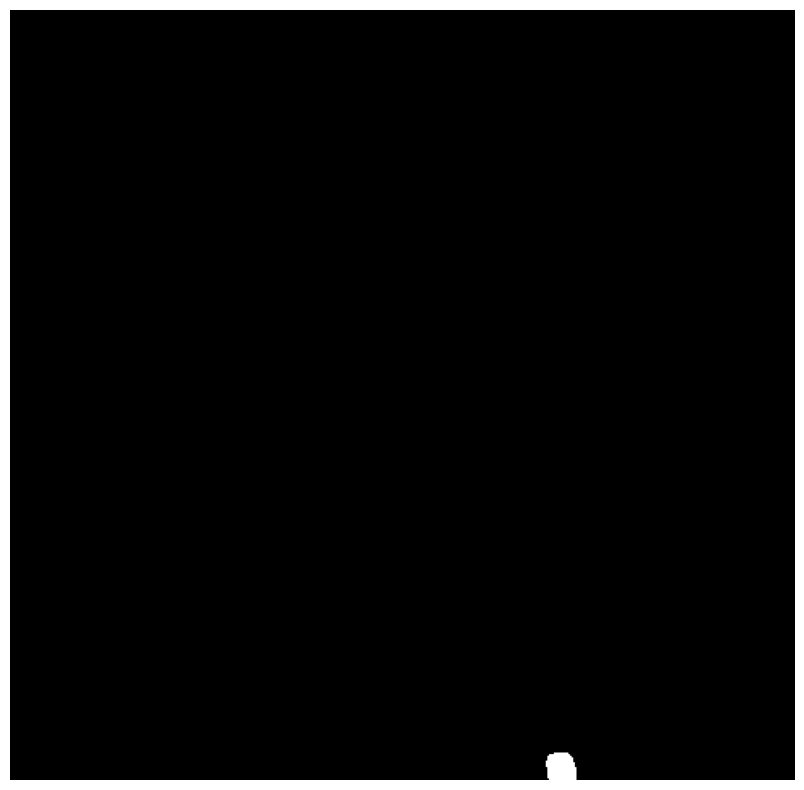

In [ ]:
sam2.show_masks(cmap="binary_r")

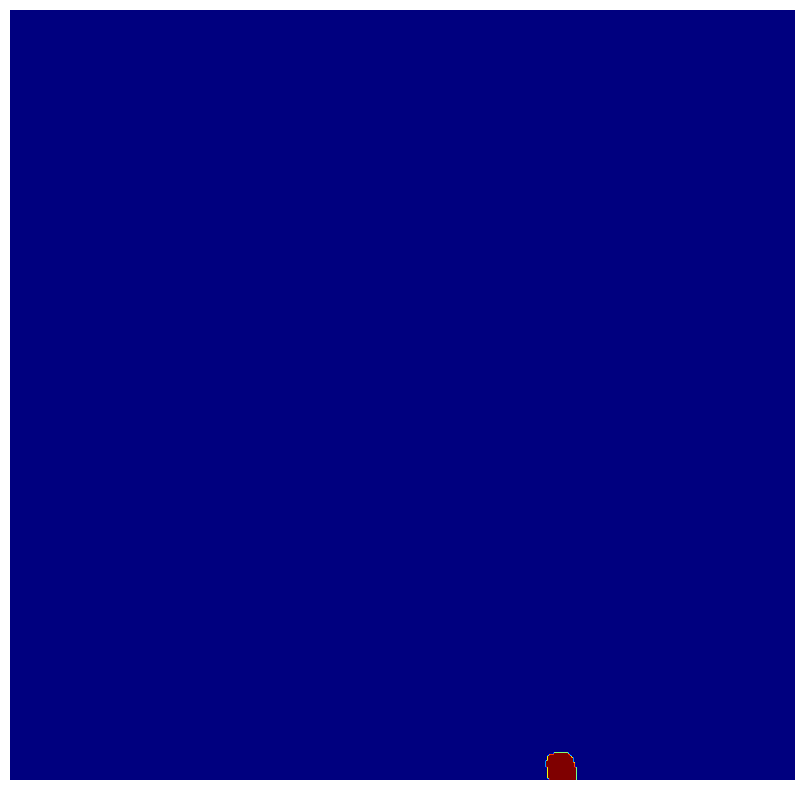

In [ ]:
sam2.show_masks(cmap="jet")

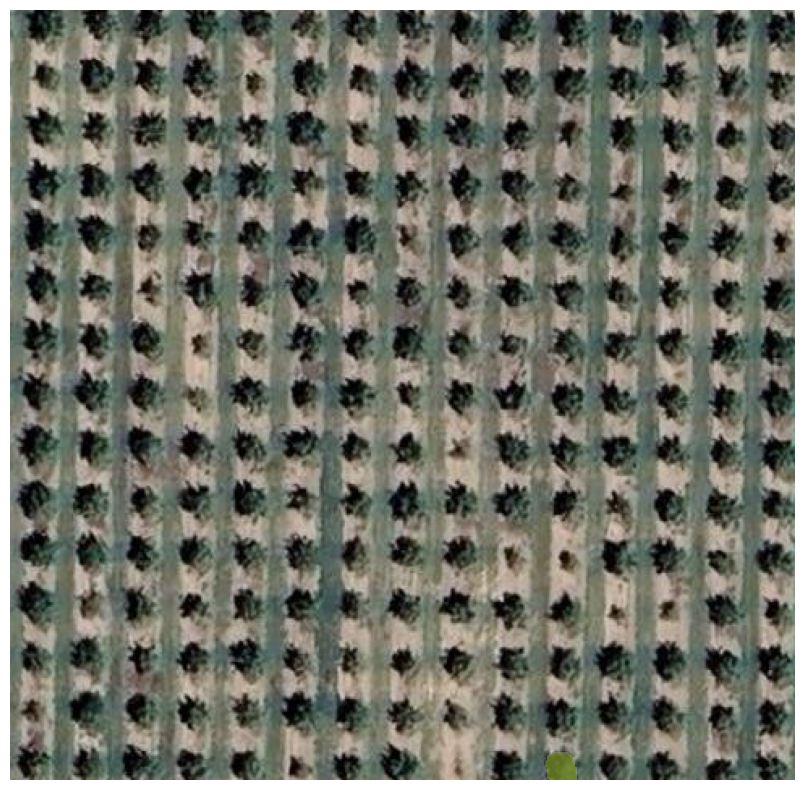

In [ ]:
sam2.show_anns(axis="off", alpha=0.7, output="/content/drive/MyDrive/Colab Notebooks/ESEARCH2024_Fall/Output/annotation_1_completely_unsupervised.tif")


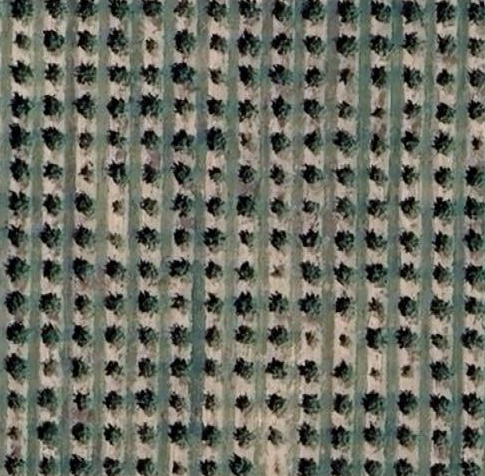
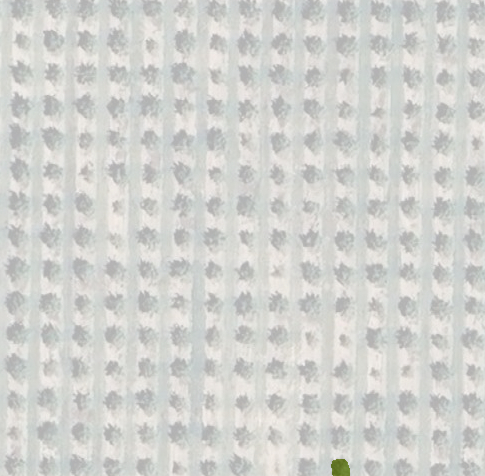

In [ ]:
leafmap.image_comparison(
    image,
    "/content/drive/MyDrive/Colab Notebooks/ESEARCH2024_Fall/Output/annotation_1_completely_unsupervised.tif",
    label1="NAIP",
    label2="Image Segmentation Completely Unsupervised",
)

In [ ]:
m.add_raster("/content/drive/MyDrive/Colab Notebooks/ESEARCH2024_Fall/Output/mask_1_completely_unsupervised.tif", colormap="jet", layer_name="Mask 1 Completely Unsupervised", nodata=0, opacity=0.7)
m

Map(bottom=25766500.0, center=[38.5043, -121.68235000000001], controls=(ZoomControl(options=['position', 'zoom…

In [ ]:
sam2.raster_to_vector("/content/drive/MyDrive/Colab Notebooks/ESEARCH2024_Fall/Output/mask_1_completely_unsupervised.tif", "/content/drive/MyDrive/Colab Notebooks/ESEARCH2024_Fall/Output/mask_1_completely_unsupervised.gpkg")

In [ ]:
m.add_vector("/content/drive/MyDrive/Colab Notebooks/ESEARCH2024_Fall/Output/mask_1_completely_unsupervised.gpkg", layer_name="Object_1_completely_unsupervised")

### Advanced Image Segmentation Configuration with SAM2 🤖🌐

- **Model Configuration** 🔧:
  - **Model ID** 🆔: Utilizes the `sam2-hiera-large` model for high-accuracy geospatial segmentation.
  - **Hyperparameters** 📊:
    - `apply_postprocessing` 🔗: Disabled to retain raw segmentation output for detailed analysis.
    - `points_per_side` and `points_per_batch` 🔄: Configurations that control the density and processing batch size of points used in segmentation.
    - `pred_iou_thresh` 🎯: Intersection Over Union threshold for predictions, enhancing precision.
    - `stability_score_thresh` and `stability_score_offset` ⚖️: Metrics that determine the reliability of segmented areas.
    - `crop_n_layers` 🥞: The number of layers to consider when cropping the image for detailed analysis.
    - `box_nms_thresh` 📦: Threshold for Non-Maximum Suppression in bounding box calculations to avoid overlap.
    - `crop_n_points_downscale_factor` 🔽: Reduces the number of points in cropped regions to speed up processing.
    - `min_mask_region_area` 📏: Minimum area for a region to be considered in segmentation to ensure significance.
    - `use_m2m` 💡: Whether to use model-to-mask strategies for enhanced segmentation accuracy.

- **Segmentation Execution** 🏃‍♂️:
  - **Generate Masks** 🎭: Creates segmentation masks based on the detailed configurations set above, storing the results in Google Drive for accessibility and further analysis.

- **Visualization and Analysis** 🖼️:
  - **Display Masks** 🌈: Shows segmentation results using the `jet` colormap for vivid and intuitive visualization.
  - **Show Annotations** 👁️‍🗨️: Overlays the segmentation on the original image with specified transparency, providing a clear comparison between pre and post-segmentation.
  - **Leafmap Comparison** 🗺️:
    - Compares the original NAIP imagery with the annotated segmentation, labeled for clarity, to assess the impact of hyperparameter tuning on segmentation results, aiding in visual assessments and decision-making.


In [ ]:
sam2 = SamGeo2(
    model_id="sam2-hiera-large",
    apply_postprocessing=False,
    points_per_side=64,
    points_per_batch=128,
    pred_iou_thresh=0.7,
    stability_score_thresh=0.92,
    stability_score_offset=0.7,
    crop_n_layers=1,
    box_nms_thresh=0.7,
    crop_n_points_downscale_factor=2,
    min_mask_region_area=25,
    use_m2m=True,
)

In [ ]:
sam2.generate(image, output="/content/drive/MyDrive/Colab Notebooks/ESEARCH2024_Fall/Output/mask_2_hyperparameter_tunned.tif")

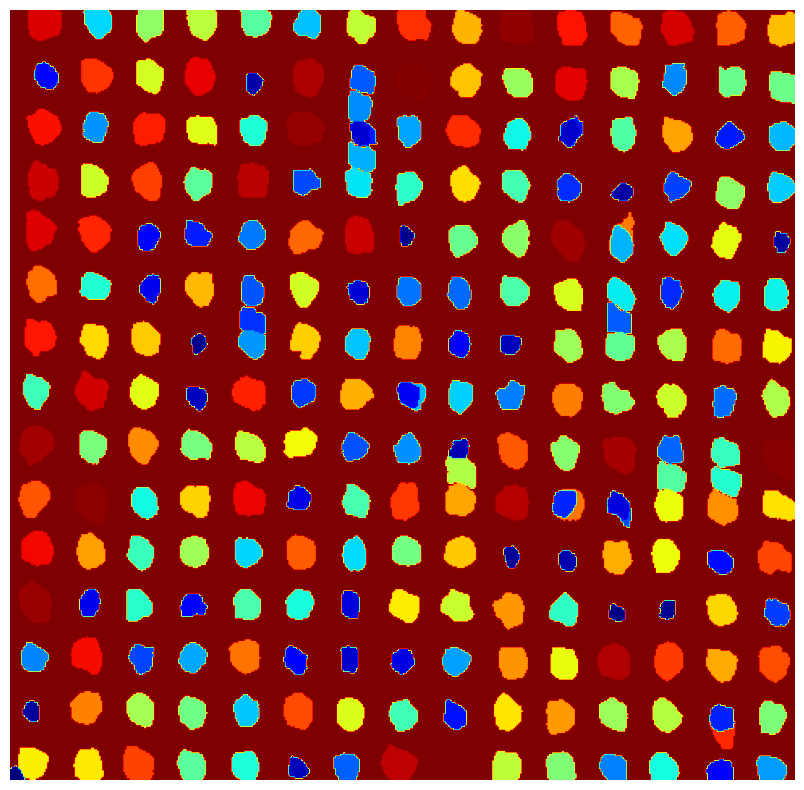

In [ ]:
sam2.show_masks(cmap="jet")

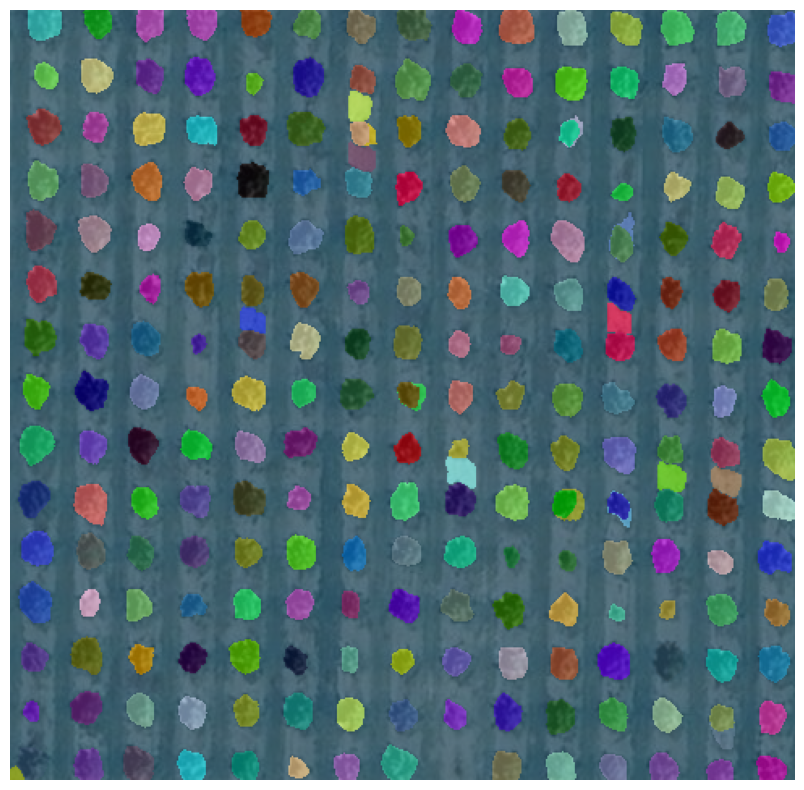

In [ ]:
sam2.show_anns(axis="off", alpha=0.7, output="/content/drive/MyDrive/Colab Notebooks/ESEARCH2024_Fall/Output/annotation_2_hyperparameter_tunned.tif")


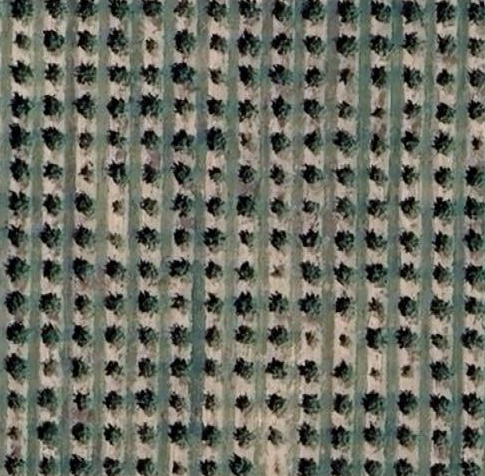
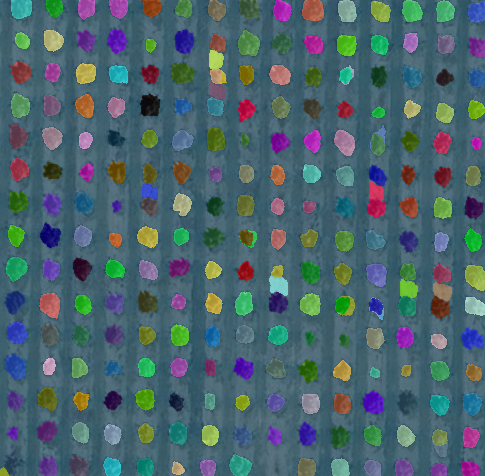

In [ ]:
leafmap.image_comparison(
    image,
    "/content/drive/MyDrive/Colab Notebooks/ESEARCH2024_Fall/Output/annotation_2_hyperparameter_tunned.tif",
    label1="NAIP",
    label2="Image Segmentation Hyperparameter Tunned",
)

### Comprehensive Workflow for Geospatial Data Handling 🌍🔍

- **Shapefile Management** 🗄️:
  - **Read Shapefile**: Loads a shapefile from Google Drive, essential for defining regions of interest (ROIs).
  - **Convert to GeoJSON**: Transforms the shapefile format to GeoJSON for broader compatibility and easier handling in web applications.
  - **Display GeoDataFrame**: Visualizes the first few entries of the GeoDataFrame to ensure proper loading and conversion.

- **Map Visualization** 🗺️:
  - **Interactive Map**: Utilizes `Leafmap` to add and visualize raster data and GeoJSON vectors on a dynamic map, enhancing spatial understanding.
  - **Layer Styling**: Applies customized styling to vector data to highlight specific features effectively.

- **Advanced Image Segmentation with SAM2** 🤖:
  - **Set Up SAM Model**: Configures and initiates the SAM2 model for high-precision segmentation, crucial for detailed image analysis.
  - **Segmentation and Mask Generation**: Executes image segmentation, generating detailed masks and annotations.
  - **Visualization Enhancements**:
    - **Display Segmented Masks**: Shows detailed segmentation masks using vibrant color maps (`gray` and `jet`) to differentiate regions clearly.
    - **Overlay Annotations**: Combines segmentation results with the original imagery for an integrated view, showing the precise effects of segmentation.

- **Image and Vector Handling** 🖼️:
  - **Vector Conversion**: Transforms segmentation masks into vector formats for use in GIS applications, enabling further spatial analysis.
  - **Map Layer Integration**: Adds these vectors as interactive layers on the map, facilitating direct visual comparison and interaction.

- **Image Comparison** 📊:
  - **Leafmap Comparison**: Employs `Leafmap` to juxtapose original and segmented imagery side-by-side, providing a stark visual comparison that highlights the segmentation's effectiveness.

In [ ]:
# Path to your shapefile
shapefile_path = '/content/drive/MyDrive/Colab Notebooks/ESEARCH2024_Fall/Shapefiles/ESEARCH2024_Fall_Google_Small_Orchard/ESEARCH2024_Fall_Google_Small_Orchard/Procedures/Shapefile/polygons_shapefile/polygons_shapefile.shp'

# Read the shapefile
gdf = gpd.read_file(shapefile_path)

# Path where you want to save the GeoJSON
output_geojson_path = '/content/drive/MyDrive/Colab Notebooks/ESEARCH2024_Fall/Shapefiles/ESEARCH2024_Fall_Google_Small_Orchard/ESEARCH2024_Fall_Google_Small_Orchard/Procedures/Shapefile/polygons_shapefile/polygons_shapefile.geojson'

# Convert and save to GeoJSON
gdf.to_file(output_geojson_path, driver='GeoJSON')


In [ ]:
geojson_Trees = '/content/drive/MyDrive/Colab Notebooks/ESEARCH2024_Fall/Shapefiles/ESEARCH2024_Fall_Google_Small_Orchard/ESEARCH2024_Fall_Google_Small_Orchard/Procedures/Shapefile/polygons_shapefile/polygons_shapefile.geojson'

In [ ]:
gdf = leafmap.geojson_to_gdf(geojson_Trees)
gdf.head()

,T_ID,T_row,T_col,geometry
0,1,1,1,"POLYGON ((-13545678.6 4650977.402, -13545668.8..."
1,2,1,2,"POLYGON ((-13545678.724 4650967.621, -13545668..."
2,3,1,3,"POLYGON ((-13545678.847 4650957.84, -13545669...."
3,4,1,4,"POLYGON ((-13545678.97 4650948.059, -13545669...."
4,5,1,5,"POLYGON ((-13545679.093 4650938.278, -13545669..."


In [ ]:
geojson = '/content/drive/MyDrive/Colab Notebooks/ESEARCH2024_Fall/Shapefiles/ESEARCH2024_Fall_Google_Small_Orchard/ESEARCH2024_Fall_Google_Small_Orchard/Procedures/Shapefile/polygons_shapefile/polygons_shapefile.geojson'
gdf.to_file(geojson)

In [ ]:
m = leafmap.Map()
m.add_raster(image, layer_name="image")
style = {
    "color": "#ffff00",
    "weight": 2,
    "fillColor": "#7c4185",
    "fillOpacity": 0,
}
m.add_vector(
    geojson,
    style=style,
    zoom_to_layer=True,
    layer_name="Bounding boxes",
    info_mode=None,
)
m

Map(center=[38.5043, -121.68235000000001], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in…

In [ ]:
sam = SamGeo(
    model_type="vit_h",
    automatic=False,
    sam_kwargs=None,
)

Model checkpoint for vit_h not found.


Downloading...
From: https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth
To: /root/.cache/torch/hub/checkpoints/sam_vit_h_4b8939.pth
100%|██████████| 2.56G/2.56G [00:18<00:00, 135MB/s]


In [ ]:
sam.set_image(image)

In [ ]:
sam.predict(
    boxes=geojson, point_crs="EPSG:4326", output="/content/drive/MyDrive/Colab Notebooks/ESEARCH2024_Fall/Output/mask_3_bonding_box.tif", dtype="uint16"
)

In [ ]:
m.add_raster(
    "/content/drive/MyDrive/Colab Notebooks/ESEARCH2024_Fall/Output/mask_3_bonding_box.tif", cmap="jet", nodata=0, opacity=0.5, layer_name="Tree masks with bounding box"
)
m

Map(bottom=103064670.0, center=[38.5043, -121.68235000000001], controls=(ZoomControl(options=['position', 'zoo…

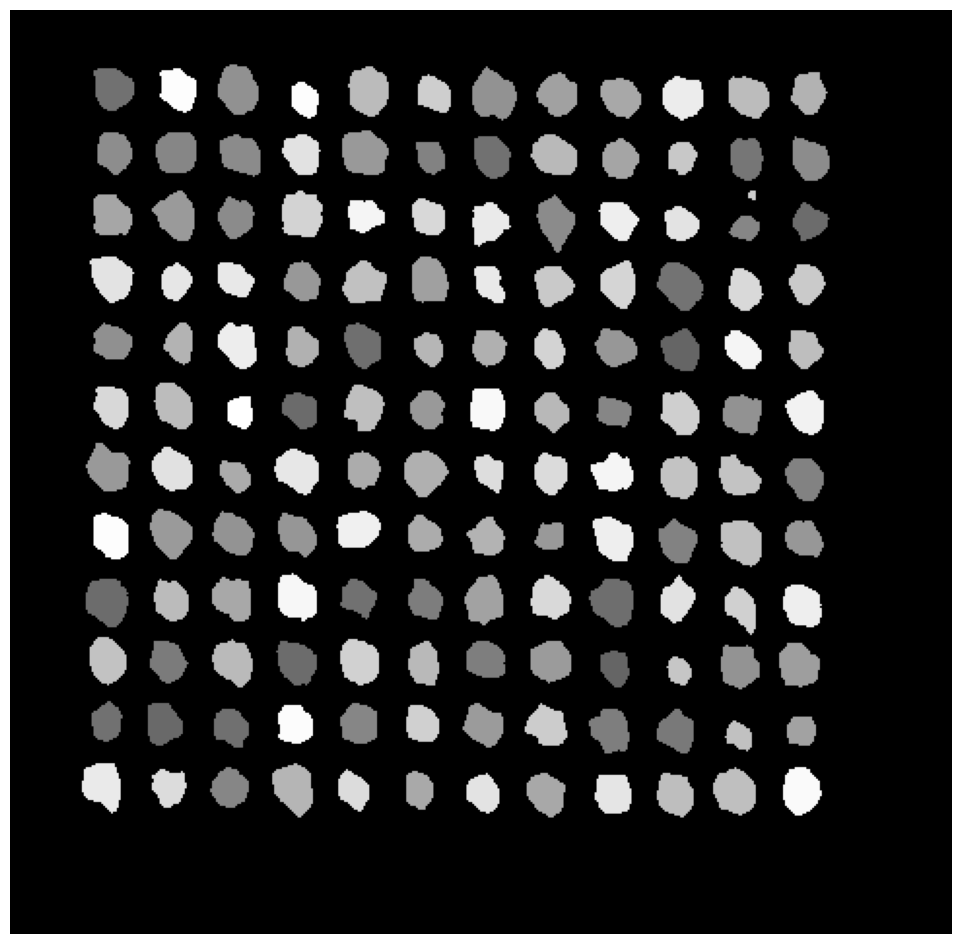

In [ ]:
def enhance_mask_with_uniform_shades(file_path, cmap='gray'):
    with rasterio.open(file_path) as src:
        mask = src.read(1)  # Assuming mask is stored in the first band
        labels = label(mask > 0)  # Label connected components

        modified_mask = np.copy(mask)
        regions = regionprops(labels)

        # Apply a random grayscale value to each region uniformly
        for region in regions:
            random_intensity = np.random.randint(100, 255)  # Adjust grayscale intensity range
            for coord in region.coords:
                modified_mask[coord[0], coord[1]] = random_intensity

        plt.figure(figsize=(20, 12))
        plt.imshow(modified_mask, cmap=cmap)
        plt.axis('off')  # Hide axes
        plt.show()

# Path to your mask file
mask_path = "/content/drive/MyDrive/Colab Notebooks/ESEARCH2024_Fall/Output/mask_3_bonding_box.tif"
enhance_mask_with_uniform_shades(mask_path, cmap='gray')

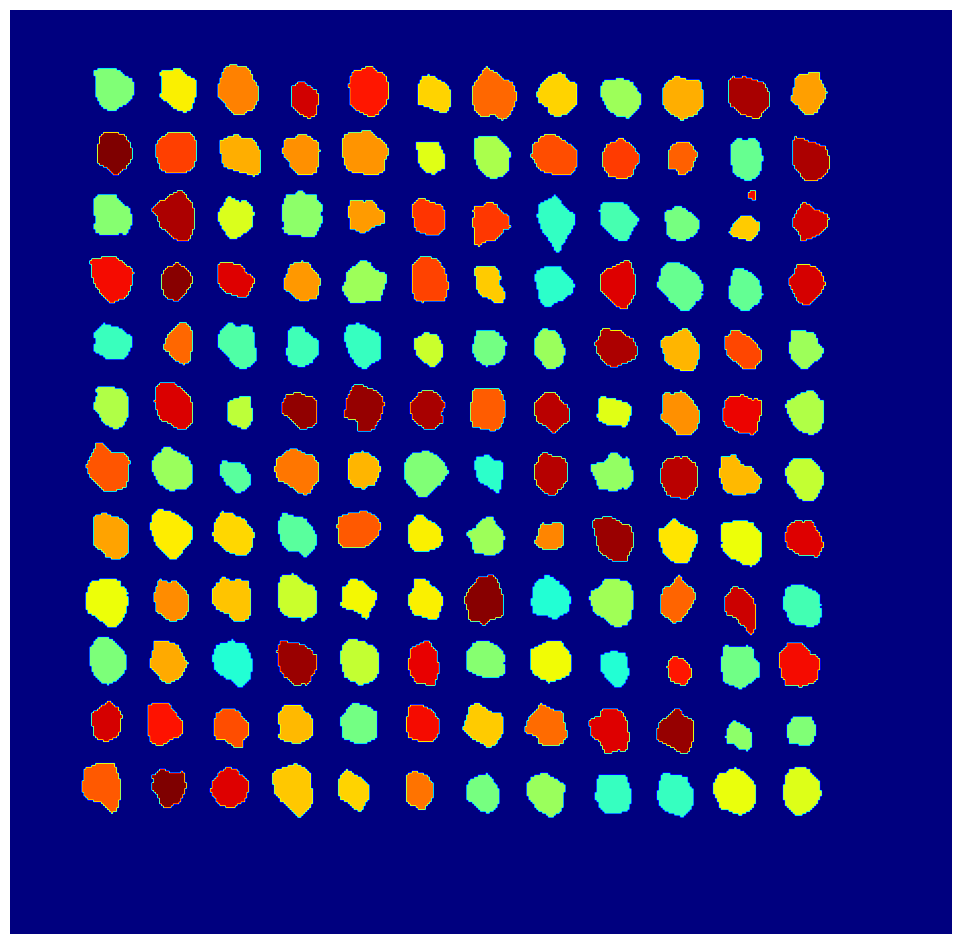

In [ ]:
def enhance_mask_with_uniform_shades(file_path, cmap='jet'):
    with rasterio.open(file_path) as src:
        mask = src.read(1)  # Assuming mask is stored in the first band
        labels = label(mask > 0)  # Label connected components

        modified_mask = np.copy(mask)
        regions = regionprops(labels)

        # Apply a random grayscale value to each region uniformly
        for region in regions:
            random_intensity = np.random.randint(100, 255)  # Adjust grayscale intensity range
            for coord in region.coords:
                modified_mask[coord[0], coord[1]] = random_intensity

        plt.figure(figsize=(20, 12))
        plt.imshow(modified_mask, cmap=cmap)
        plt.axis('off')  # Hide axes
        plt.show()

# Path to your mask file
mask_path = "/content/drive/MyDrive/Colab Notebooks/ESEARCH2024_Fall/Output/mask_3_bonding_box.tif"
enhance_mask_with_uniform_shades(mask_path, cmap='jet')

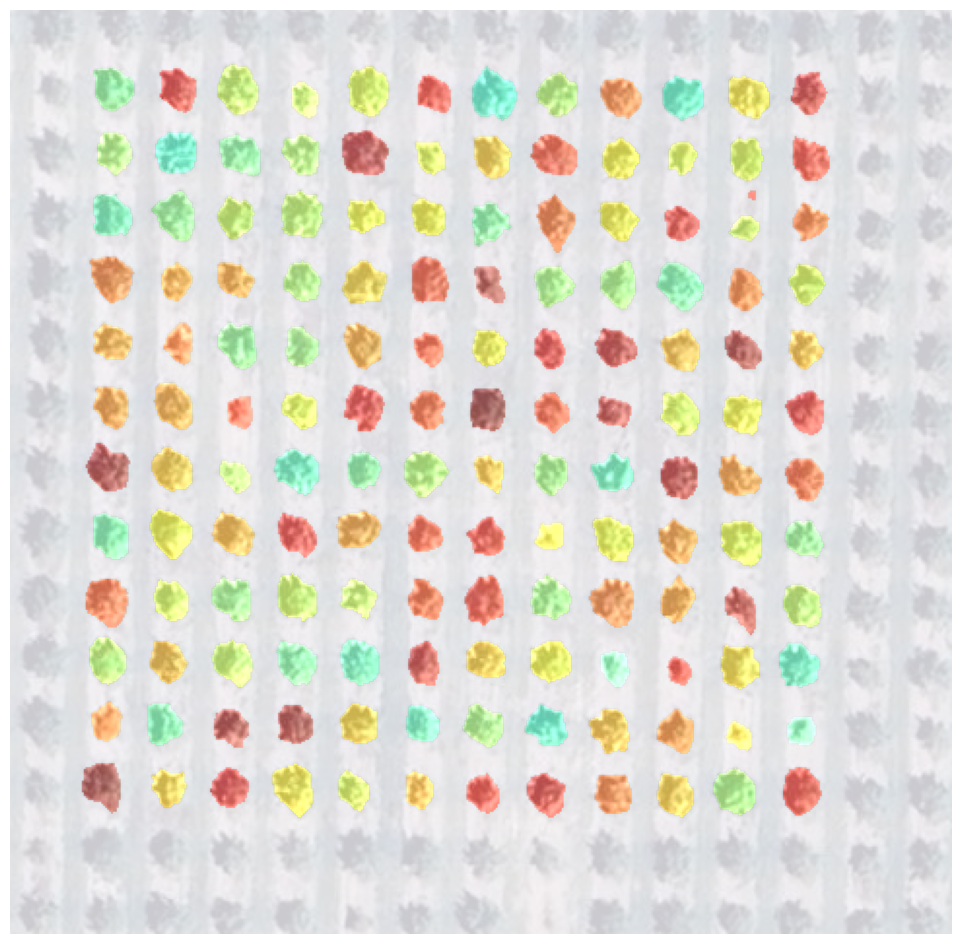

In [ ]:
def create_and_display_annotated_image(rgb_image_path, mask_path, output_path=None, alpha=0.7, cmap='jet', display=True):
    # Load the RGB image
    with rasterio.open(rgb_image_path) as src:
        rgb = src.read([1, 2, 3])  # Assuming RGB image is in first three bands
        rgb_transform = src.transform  # Preserve geotransform metadata
        crs = src.crs  # Preserve coordinate reference system
        rgb = np.moveaxis(rgb, 0, -1)  # Reorder dimensions to [height, width, channels]

    # Load and enhance the mask
    with rasterio.open(mask_path) as src:
        mask = src.read(1)  # Assuming mask is stored in the first band
        labels = label(mask > 0)  # Label connected components
        enhanced_mask = np.zeros(mask.shape, dtype=np.uint8)

        # Apply a random color to each region uniformly
        regions = regionprops(labels)
        for region in regions:
            random_color = np.random.randint(100, 255)  # Adjust grayscale intensity range
            for coord in region.coords:
                enhanced_mask[coord[0], coord[1]] = random_color

    # Create an RGBA image of the mask
    cmap = plt.get_cmap(cmap)
    mask_rgba = cmap(enhanced_mask / 255.0)  # Normalize and apply colormap
    mask_rgba[:, :, 3] = (mask > 0) * alpha + (mask == 0) * (alpha * 0.3)  # Higher alpha for trees, lower for background

    # Combine the images
    combined_image = rgb.astype('float32')
    combined_image = np.concatenate((combined_image, np.zeros((*rgb.shape[:2], 1), dtype=rgb.dtype)), axis=2)  # Add alpha channel
    combined_image[:, :, :3] += mask_rgba[:, :, :3] * 255 * mask_rgba[:, :, 3:4]  # Alpha blending
    combined_image[:, :, 3] = mask_rgba[:, :, 3] * 255  # Set alpha channel
    combined_image = np.clip(combined_image, 0, 255).astype('uint8')

    # Save the combined image if an output path is provided
    if output_path:
        with rasterio.open(
            output_path, 'w', driver='GTiff',
            height=combined_image.shape[0], width=combined_image.shape[1],
            count=4, dtype=combined_image.dtype,  # Saving as RGBA
            crs=crs, transform=rgb_transform) as dst:
            for i in range(4):
                dst.write(combined_image[:, :, i], i + 1)

    # Display the combined image if desired
    if display:
        plt.figure(figsize=(20, 12))
        plt.imshow(combined_image)
        plt.axis('off')
        plt.show()

# Paths to your RGB and mask files
rgb_image_path = "/content/drive/MyDrive/Colab Notebooks/ESEARCH2024_Fall/Google_Data/Google_Small_Orchard.tif"
mask_path = "/content/drive/MyDrive/Colab Notebooks/ESEARCH2024_Fall/Output/mask_3_bonding_box.tif"
output_path = "/content/drive/MyDrive/Colab Notebooks/ESEARCH2024_Fall/Output/annotation_3_bonding_box.tif"

create_and_display_annotated_image(rgb_image_path, mask_path, output_path)


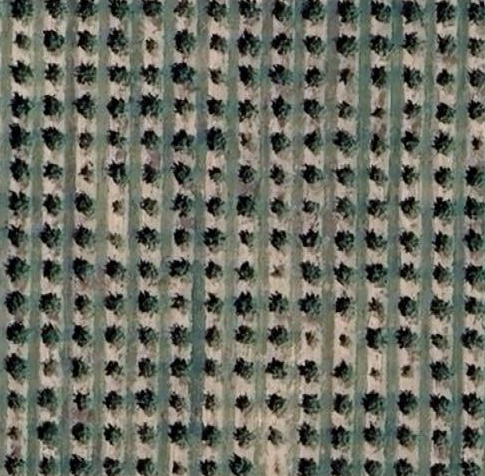
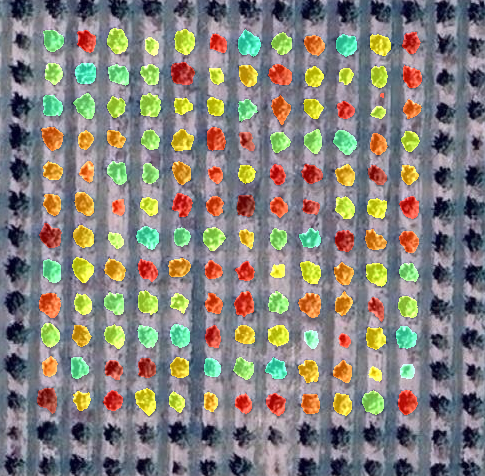

In [ ]:
leafmap.image_comparison(
    image,
    "/content/drive/MyDrive/Colab Notebooks/ESEARCH2024_Fall/Output/annotation_3_bonding_box.tif",
    label1="NAIP",
    label2="Image Segmentation Bounding Box",
)

### Processing and Visualizing Tree Area Data 🌲📏

#### Data Preparation and Area Calculation
- **Load the Mask** 🎭: Opens the segmentation mask from a TIFF file to read the relevant data.
- **Generate Shapes from Mask** 🔄: Extracts shapes from the mask, considering only significant areas (mask > 0), and transforms them into GeoDataFrame for spatial operations.
- **Load Bounding Boxes** 📦: Reads the bounding boxes from a GeoJSON file, which delineate areas of interest around each tree.
- **Spatial Join** 🔗: Merges bounding boxes with mask data to identify which parts of the mask intersect with each bounding box.
- **Area Calculation** 📐: Uses `overlay` and `union_all()` to combine all mask geometries and calculates the area of the mask within each bounding box.
- **Summation and Conversion** 🧮: Sums the areas for each bounding box and converts the result from pixel count to square meters, assuming each pixel represents 0.09 m².
- **Save Results** 💾: Outputs the calculated areas to a CSV file for further analysis or archiving.

#### KDE Plot Visualization
- **Load Data** 📂: Retrieves the tree area data from the previously saved CSV file.
- **Plot Aesthetics** 🎨: Sets the visual style to a clean and gridless background.
- **KDE Plot** 📉: Creates a Kernel Density Estimate plot to visualize the distribution of tree areas in square meters. The plot uses a dark green color for edges and light green for the fill with transparency.
- **Plot Customization** ✍️: Adds a title and labels with font size adjustments, enhancing readability.


In [ ]:
# Load the mask
mask_path = "/content/drive/MyDrive/Colab Notebooks/ESEARCH2024_Fall/Output/mask_3_bonding_box.tif"
with rasterio.open(mask_path) as src:
    mask = src.read(1)  # Read the first band
    transform = src.transform

# Generate shapes from the mask
mask_shapes = shapes(mask, mask=(mask > 0), transform=transform)

# Convert shapes to GeoDataFrame
mask_gdf = gpd.GeoDataFrame.from_features(
    [{'geometry': shape(geom), 'properties': {'value': value}} for geom, value in mask_shapes],
    crs=src.crs
)

# Load the bounding boxes GeoDataFrame
geojson_path = "/content/drive/MyDrive/Colab Notebooks/ESEARCH2024_Fall/Shapefiles/ESEARCH2024_Fall_Google_Small_Orchard/ESEARCH2024_Fall_Google_Small_Orchard/Procedures/Shapefile/polygons_shapefile/polygons_shapefile.geojson"
bounding_boxes = gpd.read_file(geojson_path)

# Spatial join to find intersecting areas using the corrected keyword
joined = gpd.sjoin(bounding_boxes, mask_gdf, how='left', predicate='intersects')

# Calculate the area covered by mask in each bounding box using union_all()
all_masks_union = overlay(mask_gdf, mask_gdf, how='union').geometry.union_all()

joined['mask_area'] = joined.apply(lambda row: row['geometry'].intersection(all_masks_union).area, axis=1)

# Sum areas for each bounding box
result = joined.groupby('T_ID')['mask_area'].sum().reset_index()

# Convert pixel count to area (m^2) - each pixel is 0.09 m^2 (0.3m * 0.3m)
result['area_m2'] = result['mask_area'] * 0.09

# Save the results to a CSV file
output_csv_path = "/content/drive/MyDrive/Colab Notebooks/ESEARCH2024_Fall/Output/tree_area_results.csv"
result.to_csv(output_csv_path, index=False)

# Display the results
result[['T_ID', 'area_m2']]

,T_ID,area_m2
0,1,2.865031
1,2,2.463766
2,3,2.840955
3,4,3.137891
4,5,2.319311
...,...,...
139,140,2.303260
140,141,2.840955
141,142,3.009487
142,143,1.556908


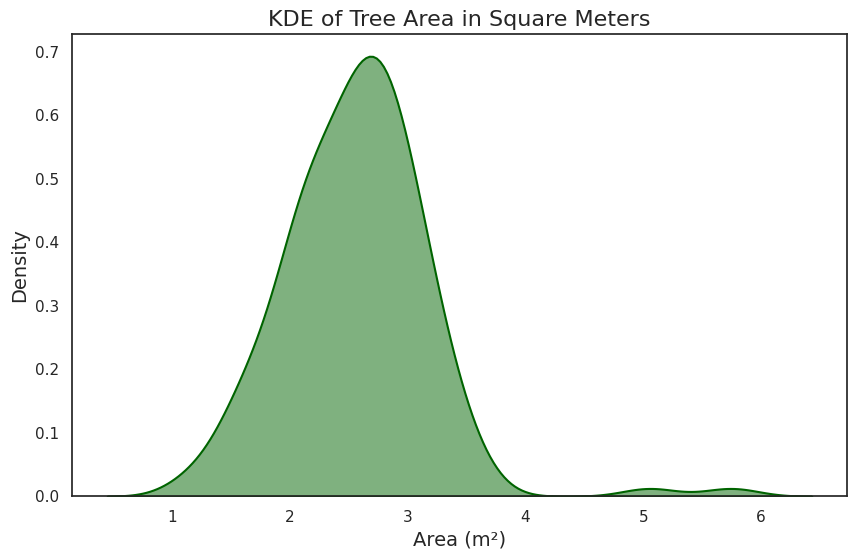

In [ ]:
# Load the data from CSV
data_path = "/content/drive/MyDrive/Colab Notebooks/ESEARCH2024_Fall/Output/tree_area_results.csv"
data = pd.read_csv(data_path)

# Set the aesthetic style of the plots
sns.set(style="white", rc={"axes.facecolor": (0, 0, 0, 0)})  # Turning off the grid

# Create the KDE plot
plt.figure(figsize=(10, 6))
kde_plot = sns.kdeplot(
    data['area_m2'],
    fill=True,
    color="darkgreen",  # Color for the edge
    alpha=0.5,  # Transparency level for the fill
    linewidth=1.5  # Width of the line at the edge
)

kde_plot.set_title('KDE of Tree Area in Square Meters', fontsize=16)
kde_plot.set_xlabel('Area (m²)', fontsize=14)
kde_plot.set_ylabel('Density', fontsize=14)

# Show the plot
plt.show()

### Image Conversion and Enhancement Workflow 🔄🌟

#### TIFF to PNG Conversion 🖼️
- **Load TIFF Image**: Open the GeoTIFF file to access high-quality satellite imagery. 🛰️
- **Ensure RGB Mode**: Convert to RGB if necessary to maintain accurate color representation. 🎨
- **Save as PNG**: Export the image to PNG format, suitable for a wide range of applications. 📦
- **Visual Confirmation**: Display the converted image using `matplotlib`, verifying the successful conversion. 👀
- **Output Notification**: Print the save location of the converted PNG, confirming file creation. 📍

#### Binary Image Processing for Annotation 🔧
- **Load Annotated PNG**: Open the manually annotated image that differentiates specific features. 📑
- **Convert to Binary**: Transform the image to a binary format to highlight annotations. ⚫⚪
- **Morphological Enhancements**: Apply morphological closing to fill gaps within annotations, improving segmentation clarity. 🔍
- **Edge Normalization**: Adjust non-zero edge pixels to maximum intensity to standardize boundaries. 🖼️
- **Save and Display Enhancements**: Save the processed image and display both original and enhanced versions for comparison. 📊
- **Pixel Analysis**: Print the counts of unique pixel values to assess image content. 📈

#### Geospatial Metadata Embedding into PNG 🌐📏
- **Retain Geospatial Metadata**: Copy metadata from the original TIFF to keep spatial referencing intact. 📝
- **Adjust Metadata for PNG**: Modify metadata settings to reflect changes in image format. 🔄
- **Embed Metadata in GeoTIFF**: Save the annotated and processed PNG as a GeoTIFF, incorporating crucial geospatial data. 🗺️
- **Confirm Metadata Integration**: Announce the creation of the geospatially-enabled file, ready for GIS use. ✅

These streamlined steps enhance the utility of geospatial imagery by maintaining both visual quality and spatial accuracy, ensuring readiness for analytical and GIS applications. 🚀

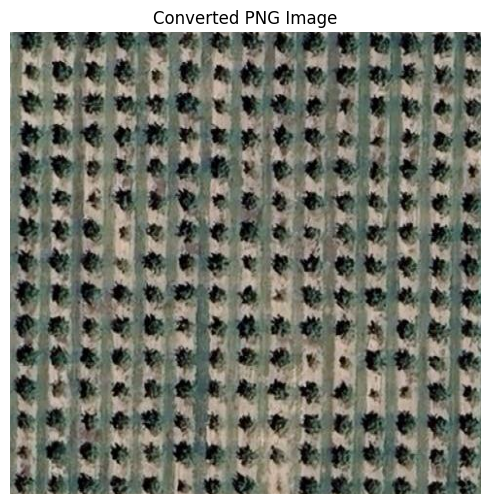

Image successfully converted and saved as: /content/drive/MyDrive/Colab Notebooks/ESEARCH2024_Fall/Google_Data/Google_Small_Orchard.png


In [ ]:
# Path to the TIFF file
tiff_path = '/content/drive/MyDrive/Colab Notebooks/ESEARCH2024_Fall/Google_Data/Google_Small_Orchard.tif'
# Path for the output PNG file
png_path = '/content/drive/MyDrive/Colab Notebooks/ESEARCH2024_Fall/Google_Data/Google_Small_Orchard.png'

# Open the TIFF file
img = Image.open(tiff_path)

# Convert the image to RGB mode if it's not already
if img.mode != 'RGB':
    img = img.convert('RGB')

# Save the image as a PNG
img.save(png_path, 'PNG')

# Display the image
plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
plt.imshow(img)
plt.axis('off')  # Turn off axis numbers and ticks
plt.title('Converted PNG Image')
plt.show()

print(f"Image successfully converted and saved as: {png_path}")

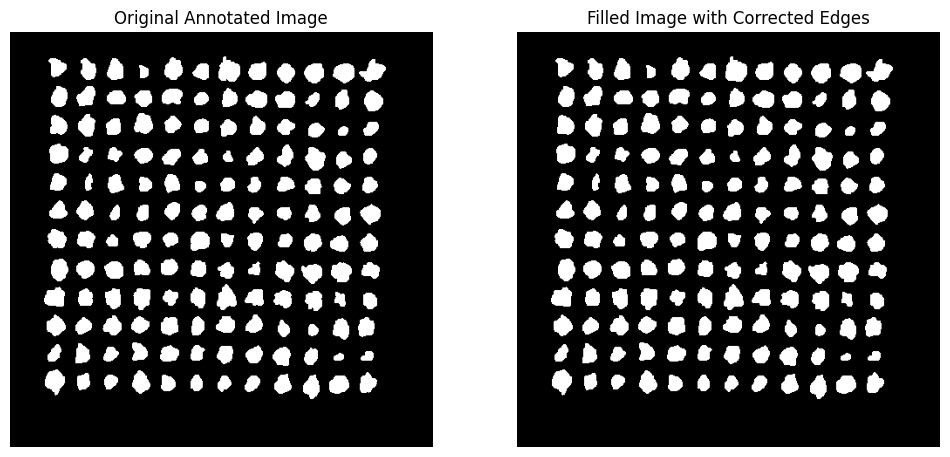

Pixel values and their counts in the filled image: {0: 189083, 255: 41777}


In [10]:
# Load the image
image_path = '/content/drive/MyDrive/Colab Notebooks/ESEARCH2024_Fall/Google_Data/Google_Small_Orchard_annotated.png'
img = Image.open(image_path)

# Convert the image to a binary array (assuming the image is grayscale)
image_array = np.array(img)
binary_image = image_array > 128  # Convert to binary: True for white, False for black

# Perform morphological closing to fill holes
filled_image = binary_closing(binary_image, structure=np.ones((3,3))).astype(int) * 255

# Ensure edge pixels that are not zero are set to 255
# Top and bottom edges
filled_image[0, :] = np.where(filled_image[0, :] > 0, 255, 0)
filled_image[-1, :] = np.where(filled_image[-1, :] > 0, 255, 0)
# Left and right edges
filled_image[:, 0] = np.where(filled_image[:, 0] > 0, 255, 0)
filled_image[:, -1] = np.where(filled_image[:, -1] > 0, 255, 0)

# Create an image from the filled array
filled_img = Image.fromarray(filled_image.astype(np.uint8))

# Save the filled image
filled_img.save('/content/drive/MyDrive/Colab Notebooks/ESEARCH2024_Fall/Google_Data/Google_Small_Orchard_filled.png')

# Display the original and filled images
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(binary_image, cmap='gray')
plt.title('Original Annotated Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(filled_image, cmap='gray')
plt.title('Filled Image with Corrected Edges')
plt.axis('off')
plt.show()

# Analyze pixel values and count occurrences
unique, counts = np.unique(filled_image, return_counts=True)
pixel_counts = dict(zip(unique, counts))
print("Pixel values and their counts in the filled image:", pixel_counts)

In [11]:
# Load the original GeoTIFF to copy its metadata
tiff_path = '/content/drive/MyDrive/Colab Notebooks/ESEARCH2024_Fall/Google_Data/Google_Small_Orchard.tif'
with rasterio.open(tiff_path) as src:
    meta = src.meta

# Update the metadata to reflect the number of bands (for PNG conversion)
meta.update(count=1, dtype=rasterio.uint8)

# Read the mask PNG image
mask_png_path = '/content/drive/MyDrive/Colab Notebooks/ESEARCH2024_Fall/Google_Data/Google_Small_Orchard_filled.png'
with rasterio.open(mask_png_path) as src_png:
    mask_data = src_png.read(1)

# Save the new mask as a GeoTIFF with the original's geospatial metadata
output_tiff_path = '/content/drive/MyDrive/Colab Notebooks/ESEARCH2024_Fall/Google_Data/Google_Small_Orchard_filled_geo.tif'
with rasterio.open(output_tiff_path, 'w', **meta) as dst:
    dst.write(mask_data, 1)

/usr/local/lib/python3.10/dist-packages/rasterio/__init__.py:355: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


### Ground Truth Spatial Analysis and Visualization 🌳📏

#### Spatial Analysis for Tree Area Calculation 🗺️
- **Load Ground Truth Mask**: Opens the GeoTIFF file containing the ground truth mask with accurate spatial metadata. 🛰️
- **Shape Extraction**: Converts the mask into geometric shapes using `rasterio`, facilitating spatial operations. 🔷
- **Load Bounding Boxes**: Retrieves predefined bounding box data from a GeoJSON file to outline specific tree areas. 📦
- **Spatial Join**: Integrates bounding boxes with mask shapes to identify overlaps, crucial for precise area calculations. 🔗
- **Area Calculation**: Computes the area of ground truth segments within each bounding box using spatial intersections and sums the results by tree ID. 📐
- **Convert and Save Results**: Translates pixel-based area measurements to square meters and saves the data to a CSV file for easy access and analysis. 💾

#### KDE Visualization of Tree Area Distribution 📊
- **Data Loading**: Fetches the tree area data from a CSV file, preparing for statistical analysis. 🔄
- **Visualization Setup**: Configures the aesthetic style of the plot for a clean and modern look, utilizing seaborn's capabilities. 🎨
- **KDE Plot Creation**: Generates a Kernel Density Estimate plot to visualize the distribution of tree areas in square meters, highlighting the variability and density of tree sizes. 📈
- **Plot Customization**: Adjusts plot labels and titles to enhance readability and adds a color scheme of dark blue for visual appeal. 🖌️
- **Display Plot**: Shows the KDE plot, providing a visual interpretation of the ground truth data's distribution across measured tree areas. 👁️‍🗨️

This streamlined documentation offers a clear and concise overview of the procedures for spatially analyzing and visualizing ground truth data in forestry applications, making it both informative and easy to understand for collaborators or stakeholders.

In [17]:
# Load the mask created from the ground truth data
mask_path = '/content/drive/MyDrive/Colab Notebooks/ESEARCH2024_Fall/Google_Data/Google_Small_Orchard_filled_geo.tif'
with rasterio.open(mask_path) as src:
    mask = src.read(1)  # Read the first band
    transform = src.transform

# Generate shapes from the mask
mask_shapes = shapes(mask, mask=(mask > 0), transform=transform)

# Convert shapes to GeoDataFrame
mask_gdf = gpd.GeoDataFrame.from_features(
    [{'geometry': shape(geom), 'properties': {'value': value}} for geom, value in mask_shapes],
    crs=src.crs
)

# Load the bounding boxes GeoDataFrame
geojson_path = "/content/drive/MyDrive/Colab Notebooks/ESEARCH2024_Fall/Shapefiles/ESEARCH2024_Fall_Google_Small_Orchard/ESEARCH2024_Fall_Google_Small_Orchard/Procedures/Shapefile/polygons_shapefile/polygons_shapefile.geojson"
bounding_boxes = gpd.read_file(geojson_path)

# Spatial join to find intersecting areas
joined = gpd.sjoin(bounding_boxes, mask_gdf, how='left', predicate='intersects')

# Calculate the area covered by mask in each bounding box
joined['mask_area'] = joined.apply(lambda row: row['geometry'].intersection(mask_gdf.geometry.unary_union).area, axis=1)

# Sum areas for each bounding box
result = joined.groupby('T_ID')['mask_area'].sum().reset_index()

# Convert pixel count to area (m^2) - each pixel is 0.09 m^2 (0.3m * 0.3m)
result['area_m2'] = result['mask_area'] * 0.09

# Save the results to a CSV file
output_csv_path = "/content/drive/MyDrive/Colab Notebooks/ESEARCH2024_Fall/Output/ground_truth_tree_area_results.csv"
result.to_csv(output_csv_path, index=False)

# Display the results
result[['T_ID', 'area_m2']]

<ipython-input-17-2a818e9baddb>:29: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  joined['mask_area'] = joined.apply(lambda row: row['geometry'].intersection(mask_gdf.geometry.unary_union).area, axis=1)


,T_ID,area_m2
0,1,2.463766
1,2,2.832930
2,3,2.857006
3,4,3.242220
4,5,2.335362
...,...,...
139,140,2.311286
140,141,2.006324
141,142,2.680449
142,143,1.027238


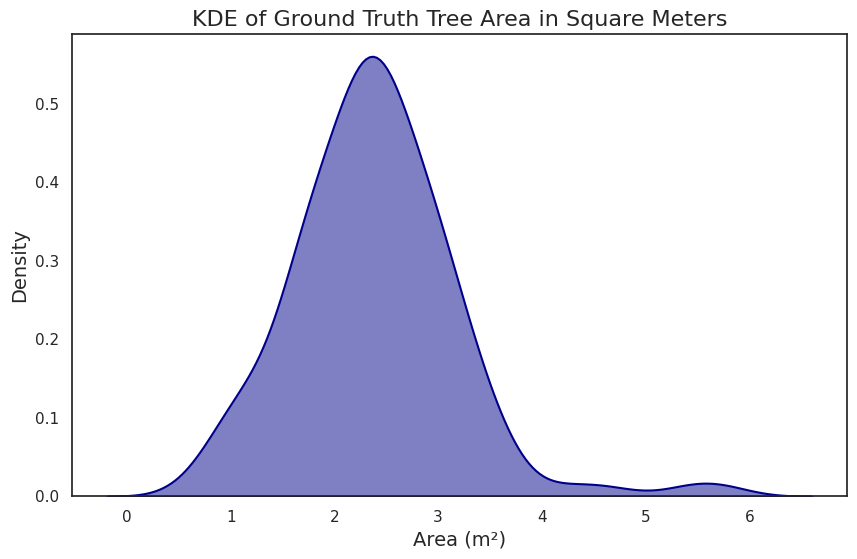

In [20]:
# Load the data from CSV
data_path = "/content/drive/MyDrive/Colab Notebooks/ESEARCH2024_Fall/Output/ground_truth_tree_area_results.csv"
data = pd.read_csv(data_path)

# Set the aesthetic style of the plots
sns.set(style="white", palette="muted", color_codes=True)

# Create the KDE plot
plt.figure(figsize=(10, 6))
kde_plot = sns.kdeplot(
    data['area_m2'],
    fill=True,
    color="darkblue",
    alpha=0.5,  # Transparency level for the fill
    linewidth=1.5  # Width of the line at the edge
)

kde_plot.set_title('KDE of Ground Truth Tree Area in Square Meters', fontsize=16)
kde_plot.set_xlabel('Area (m²)', fontsize=14)
kde_plot.set_ylabel('Density', fontsize=14)

# Show the plot
plt.show()

### Comparative Analysis of Tree Area Distributions 🌳📊

  - **Data Sources** 🗃️:
  - **SAM2 Estimated Area**: Represents the tree area estimated by the SAM2 segmentation model.
  - **Ground Truth Area**: The actual measured tree area from ground truth data.
  
- **Visualization** 🖼️:
  - **KDE Plots**: Kernel Density Estimate (KDE) plots are generated for both SAM2 and ground truth datasets to compare their area distributions visually.
  - **Aesthetics**: The plots are color-coded—dark green for SAM2 and dark blue for ground truth—to easily differentiate the two distributions.
  - **Interactivity**: Plots are equipped with interactive legend toggles, allowing for focused analysis on one dataset at a time.

### Performance Metrics and Confusion Matrix 📏🔍

- **Setup** 🛠️:
  - **Mask Loading**: Binary masks from both SAM2 and ground truth are loaded to compare their spatial overlap.
  - **Confusion Matrix Calculation**: A confusion matrix is computed to quantify the correct and incorrect classifications of tree and soil areas by SAM2 relative to the ground truth.
  
- **Normalized Confusion Matrix** 📉:
  - **Visualization**: Displayed using a heatmap, the confusion matrix shows percentages normalized row-wise to highlight the proportion of each true class correctly or incorrectly predicted.
  - **Labels**: Axes are labeled with 'Tree' and 'Soil' to clarify predictions versus actual classifications.

- **Quantitative Metrics** 📈:
  - **Accuracy, Precision, Recall, F1 Score, IoU (Intersection over Union)**: These metrics provide a comprehensive statistical evaluation of SAM2's performance against the ground truth.
  - **Presentation**: Metrics are presented in a clear table format, facilitating quick assessment and interpretation.

- **Insights** 🧠:
  - This comparative analysis not only underscores the accuracy of tree segmentation using deep learning models like SAM2 but also emphasizes areas for improvement in distinguishing between tree and soil regions more effectively.

This dual approach of visual and quantitative analysis offers a robust framework for validating and refining geospatial segmentation models, ensuring they meet the precision requirements for ecological and agricultural applications.


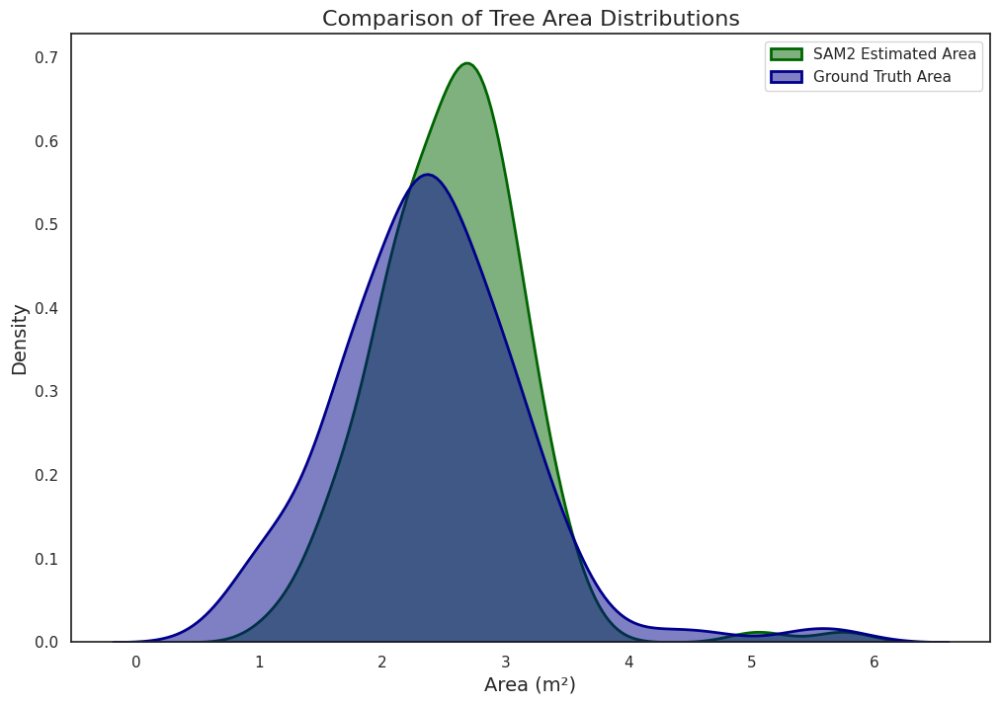

In [23]:
# Load the data from CSVs
data_path_sam2 = "/content/drive/MyDrive/Colab Notebooks/ESEARCH2024_Fall/Output/tree_area_results.csv"
data_sam2 = pd.read_csv(data_path_sam2)

data_path_ground_truth = "/content/drive/MyDrive/Colab Notebooks/ESEARCH2024_Fall/Output/ground_truth_tree_area_results.csv"
data_ground_truth = pd.read_csv(data_path_ground_truth)

# Set the aesthetic style of the plots
sns.set(style="white", palette="muted", color_codes=True)

# Create the KDE plot for both datasets in one graph for direct comparison
plt.figure(figsize=(12, 8))
sns.kdeplot(
    data_sam2['area_m2'],
    fill=True,
    color="darkgreen",
    alpha=0.5,
    linewidth=2,
    label="SAM2 Estimated Area"
)
sns.kdeplot(
    data_ground_truth['area_m2'],
    fill=True,
    color="darkblue",
    alpha=0.5,
    linewidth=2,
    label="Ground Truth Area"
)

plt.title('Comparison of Tree Area Distributions', fontsize=16)
plt.xlabel('Area (m²)', fontsize=14)
plt.ylabel('Density', fontsize=14)
plt.legend()

plt.show()

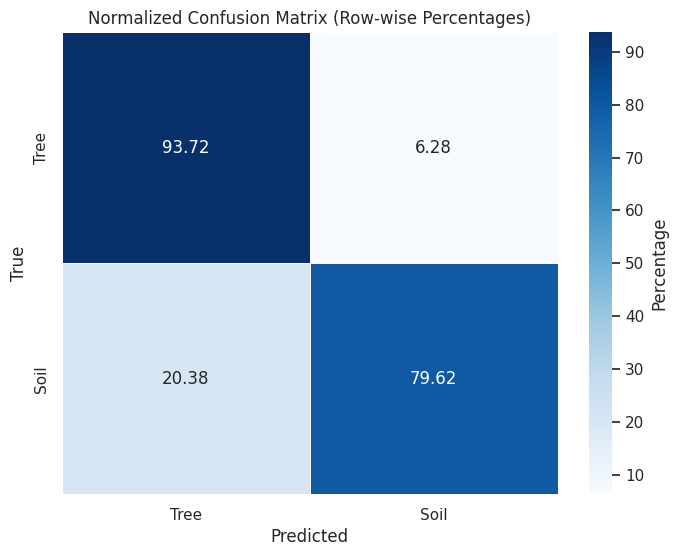

,Metric,Value
0,Accuracy,0.911669
1,Precision,0.736869
2,Recall,0.796204
3,F1 Score,0.765388
4,IoU,0.619942


In [33]:
def calculate_metrics(mask1_path, mask2_path):
    # Load mask1 (SAM2)
    with rasterio.open(mask1_path) as src:
        mask1 = src.read(1)
        mask1 = mask1 > 0  # Convert to binary mask

    # Load mask2 (Ground Truth)
    with rasterio.open(mask2_path) as src:
        mask2 = src.read(1)
        mask2 = mask2 > 0  # Convert to binary mask

    # Flatten the arrays for comparison
    mask1_flat = mask1.flatten()
    mask2_flat = mask2.flatten()

    # Compute the confusion matrix
    cm = confusion_matrix(mask2_flat, mask1_flat)
    cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis] * 100  # Normalize by row

    # Calculate additional metrics
    accuracy = accuracy_score(mask2_flat, mask1_flat)
    precision = precision_score(mask2_flat, mask1_flat)
    recall = recall_score(mask2_flat, mask1_flat)
    f1 = f1_score(mask2_flat, mask1_flat)
    iou = np.sum(np.logical_and(mask1, mask2)) / np.sum(np.logical_or(mask1, mask2))

    # Display the confusion matrix using Seaborn
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm_normalized, annot=True, fmt=".2f", linewidths=.5, cmap="Blues", cbar_kws={'label': 'Percentage'},
                xticklabels=['Tree', 'Soil'], yticklabels=['Tree', 'Soil'])
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title('Normalized Confusion Matrix (Row-wise Percentages)')
    plt.show()

    # Create a dataframe for metrics
    metrics_df = pd.DataFrame({
        "Metric": ["Accuracy", "Precision", "Recall", "F1 Score", "IoU"],
        "Value": [accuracy, precision, recall, f1, iou]
    })

    return metrics_df

# File paths
mask1_path = "/content/drive/MyDrive/Colab Notebooks/ESEARCH2024_Fall/Output/mask_3_bonding_box.tif"  # SAM2 mask
mask2_path = '/content/drive/MyDrive/Colab Notebooks/ESEARCH2024_Fall/Google_Data/Google_Small_Orchard_filled_geo.tif'  # Ground truth mask

# Calculate metrics
metrics_df = calculate_metrics(mask1_path, mask2_path)

# Display the metrics in a formatted table
display(metrics_df.style.set_properties(**{'text-align': 'center'}))

### Acknowledgments 📜

We extend our deepest gratitude to the Digital Agriculture Laboratory and the respective departments at the University of California, Davis for providing the resources and support necessary to conduct this research.

Special thanks to Dr. Qiusheng Wu and the Open Geospatial Solutions team for developing the segment-geospatial library, which has significantly contributed to the success of our project. Their innovative tools have been instrumental in advancing our research in geospatial data analysis. More about their work can be found at their GitHub repository: [Segment-Geospatial](https://github.com/opengeos/segment-geospatial).

### Contact Information 📞💻:
For more information, queries, or feedback regarding this project, please contact:
- **Mohammadreza Narimani** - [mnarimani@ucdavis.edu](mailto:mnarimani@ucdavis.edu)
- **Sarbani Kumar** - [srbkumar@ucdavis.edu](mailto:srbkumar@ucdavis.edu)
